# Import_needful_library

In [2]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 74.2 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import torch
import torch.nn as nn
import torch
import torch.nn as nn 
import os
from glob import glob 
from torch.utils.data import Dataset,DataLoader
from tqdm.notebook import tqdm 
import numpy as np
import rasterio
from sklearn.model_selection import train_test_split
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from torch.nn import BCEWithLogitsLoss
import wandb
from torch.optim import Adam
import cv2

# Model_unet

In [6]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Wed Jul 24 23:49:01 2024

@author: surajit
"""


def double_convolution(in_channels, out_channels):
    """
    In the original paper implementation, the convolution operations were
    not padded but we are padding them here. This is because, we need the 
    output result size to be same as input size.
    """
    conv_op = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )
    return conv_op


class UNet(nn.Module):
    def __init__(self, num_classes = 1):
        super(UNet, self).__init__()
        self.max_pool2d = nn.MaxPool2d(kernel_size=2, stride=2)
        # Contracting path.
        # Each convolution is applied twice.
        self.down_convolution_1 = double_convolution(4, 64)
        self.down_convolution_2 = double_convolution(64, 128)
        self.down_convolution_3 = double_convolution(128, 256)
        self.down_convolution_4 = double_convolution(256, 512)
        self.down_convolution_5 = double_convolution(512, 1024)
        # Expanding path.
        self.up_transpose_1 = nn.ConvTranspose2d(
            in_channels=1024, out_channels=512,
            kernel_size=2, 
            stride=2)
        # Below, `in_channels` again becomes 1024 as we are concatinating.
        self.up_convolution_1 = double_convolution(1024, 512)
        self.up_transpose_2 = nn.ConvTranspose2d(
            in_channels=512, out_channels=256,
            kernel_size=2, 
            stride=2)
        self.up_convolution_2 = double_convolution(512, 256)
        self.up_transpose_3 = nn.ConvTranspose2d(
            in_channels=256, out_channels=128,
            kernel_size=2, 
            stride=2)
        self.up_convolution_3 = double_convolution(256, 128)
        self.up_transpose_4 = nn.ConvTranspose2d(
            in_channels=128, out_channels=64,
            kernel_size=2, 
            stride=2)
        self.up_convolution_4 = double_convolution(128, 64)
        # output => `out_channels` as per the number of classes.
        self.out = nn.Conv2d(
            in_channels=64, out_channels=1, 
            kernel_size=1
        ) 

        self.prob = nn.Sigmoid()
        
    def forward(self, x):
        down_1 = self.down_convolution_1(x)
        down_2 = self.max_pool2d(down_1)
        down_3 = self.down_convolution_2(down_2)
        down_4 = self.max_pool2d(down_3)
        down_5 = self.down_convolution_3(down_4)
        down_6 = self.max_pool2d(down_5)
        down_7 = self.down_convolution_4(down_6)
        down_8 = self.max_pool2d(down_7)
        down_9 = self.down_convolution_5(down_8)        
        # *** DO NOT APPLY MAX POOL TO down_9 ***
        
        up_1 = self.up_transpose_1(down_9)
        x = self.up_convolution_1(torch.cat([down_7, up_1], 1))
        up_2 = self.up_transpose_2(x)
        x = self.up_convolution_2(torch.cat([down_5, up_2], 1))
        up_3 = self.up_transpose_3(x)
        x = self.up_convolution_3(torch.cat([down_3, up_3], 1))
        up_4 = self.up_transpose_4(x)
        x = self.up_convolution_4(torch.cat([down_1, up_4], 1))
        out = self.out(x)
        out = self.prob(out)
        return out
    
    
if __name__ == '__main__':
    input_image = torch.rand((1, 4, 256, 256))
    model = UNet()
    # # Total parameters and trainable parameters.
    # total_params = sum(p.numel() for p in model.parameters())
    # print(f"{total_params:,} total parameters.")
    # total_trainable_params = sum(
    #     p.numel() for p in model.parameters() if p.requires_grad)
    # print(f"{total_trainable_params:,} training parameters.")
    outputs = model(input_image)
    print(outputs.shape)
    print(outputs)

torch.Size([1, 1, 256, 256])
tensor([[[[0.5389, 0.5699, 0.5199,  ..., 0.4553, 0.5068, 0.5771],
          [0.6593, 0.4716, 0.5717,  ..., 0.4190, 0.5420, 0.4966],
          [0.5013, 0.4976, 0.4410,  ..., 0.6217, 0.4273, 0.5460],
          ...,
          [0.5712, 0.5392, 0.5314,  ..., 0.5459, 0.6305, 0.4869],
          [0.6204, 0.5920, 0.5196,  ..., 0.5872, 0.4357, 0.5016],
          [0.6015, 0.5806, 0.5301,  ..., 0.5130, 0.5182, 0.5015]]]],
       grad_fn=<SigmoidBackward0>)


# Dataset & dataloader

In [7]:
## data loading and paired for img and mask images 



class farmdataset(Dataset):
    def __init__(self,paths):
        self.img = []
        self.annot = []
        
        for imgpath ,lblpath in (paths):
            img , label = self.__read_data(imgpath ,lblpath)
            if (label.sum() / (256**2)) > .4:
                self.img.append(img)
                self.annot.append(label)
            
    def __len__(self):
        return len(self.img)
            
    def __read_data(self, imagepath, labelpath):
        with rasterio.open(imagepath) as src:
            red = src.read(4)
            green = src.read(3)
            blue = src.read(2)
            nir = src.read(8)
        
            rgb_image = np.stack((blue, green, red, nir), axis=-1)
            imgdata = (rgb_image / rgb_image.max() * 255).astype(np.uint8)
 
        # imgdata = read_raster(imagepath)
        image = imgdata[:256, :256, :] / 255
        image = np.transpose(image, (2, 0, 1))

        label = cv2.imread(labelpath, -1)
        label = np.where(label == 255, 1,0)
        label= np.expand_dims(label,0)
        
        return image, label 

    def __getitem__(self, idx):
        image = self.img[idx]
        label = self.annot[idx]
        
        sample = {
            'data': torch.tensor(image, dtype=torch.float),
            'label': torch.tensor(label, dtype=torch.float)
        }
        
        return sample
    def plot(self,idx):
        image = self.img[idx]
        label = self.annot[idx]

        # Create subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
        
        # Plot data on the first subplot
        ax1.imshow(np.dstack(image[:3]))
        ax1.set_title('Image')
        
        # Plot data on the second subplot
        ax2.imshow(label[0])
        ax2.set_title('label')
        
        plt.tight_layout()
        
        # Display the plots
        plt.show()


In [8]:
image_paths =  '/kaggle/input/farm-boundary-dataset-solafune/chanked_images'
mask_paths = '/kaggle/input/farm-boundary-dataset-solafune/chanked_masks'

paired_images = []

files = glob(os.path.join(image_paths,'*.tif'))

for file in files:
    
    fname = os.path.basename(file)
    annoted_img  =fname.replace('img', 'mask') 
    
    img_path = os.path.join(image_paths,fname)
    annot_path =  os.path.join(mask_paths, annoted_img)
    
    if os.path.exists(img_path) and os.path.exists(annot_path):
        paired_images.append((img_path,annot_path))
 
    
image_label_paths_training , image_label_paths_validation = train_test_split(paired_images, train_size=0.7)


trainDS = farmdataset(image_label_paths_training)
testDS = farmdataset(image_label_paths_validation)
print('train :', len(trainDS), 'test :', len(testDS))

batch_size = 8
shuffle = True  # Whether to shuffle the data
num_workers = 4

train_dataloader = DataLoader(trainDS, batch_size=5, shuffle=shuffle, num_workers=num_workers)
validation_dataloader = DataLoader(testDS, batch_size=5, shuffle=shuffle, num_workers=num_workers)

/tmp/ipykernel_30/829513016.py:27: RuntimeWarning: invalid value encountered in cast
  imgdata = (rgb_image / rgb_image.max() * 255).astype(np.uint8)


train : 365 test : 150


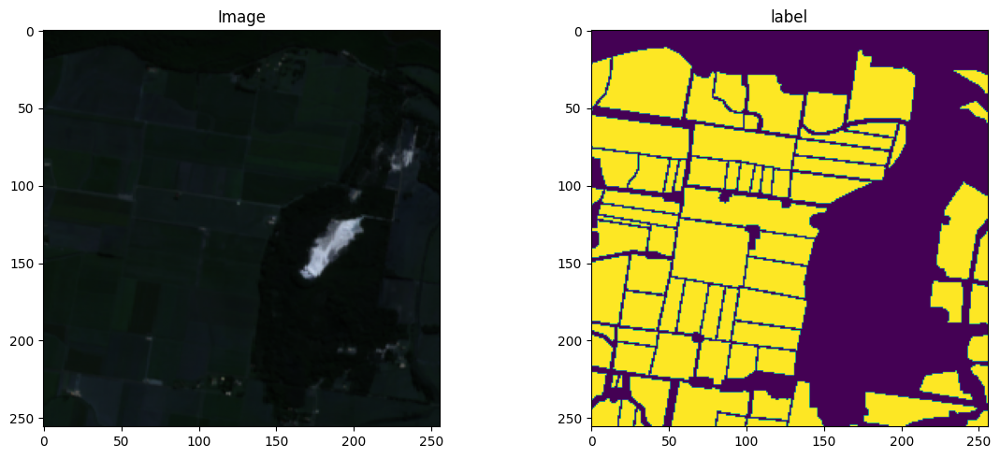

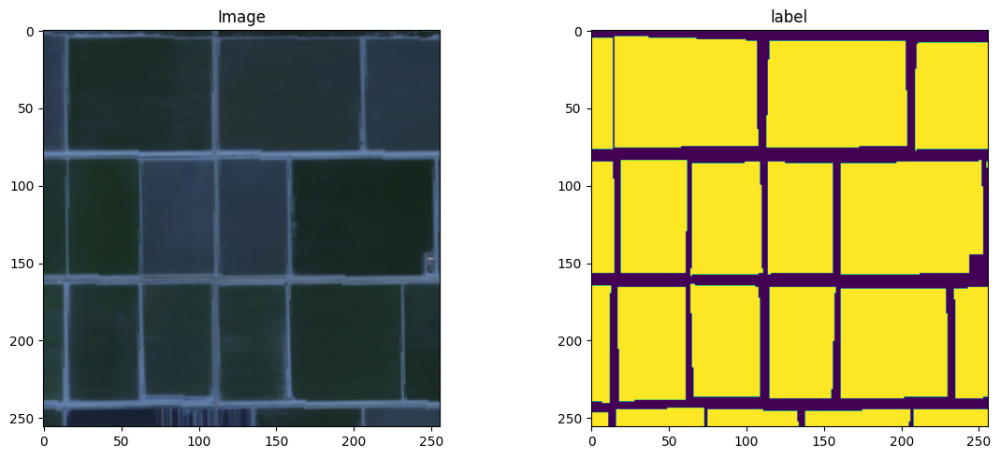

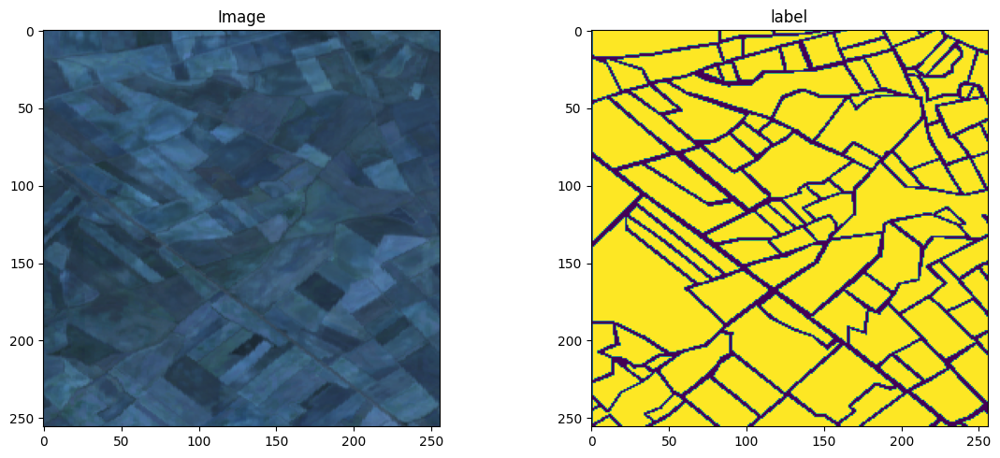

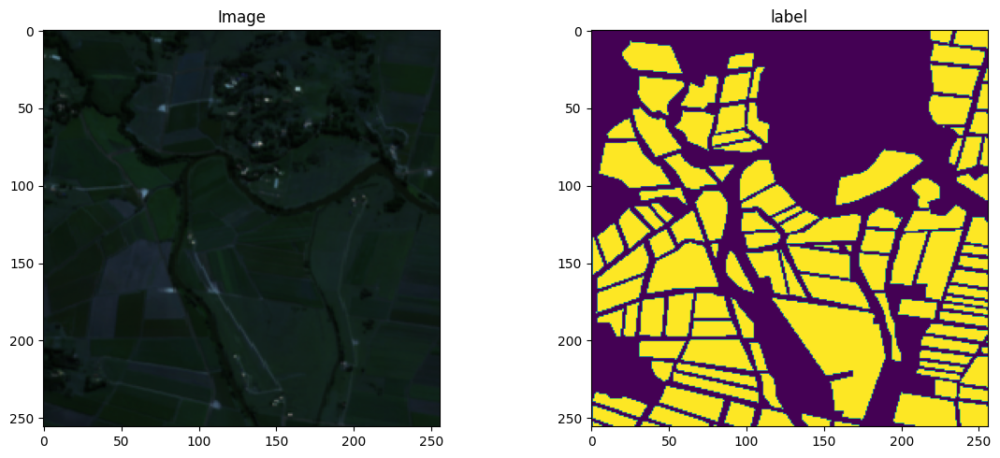

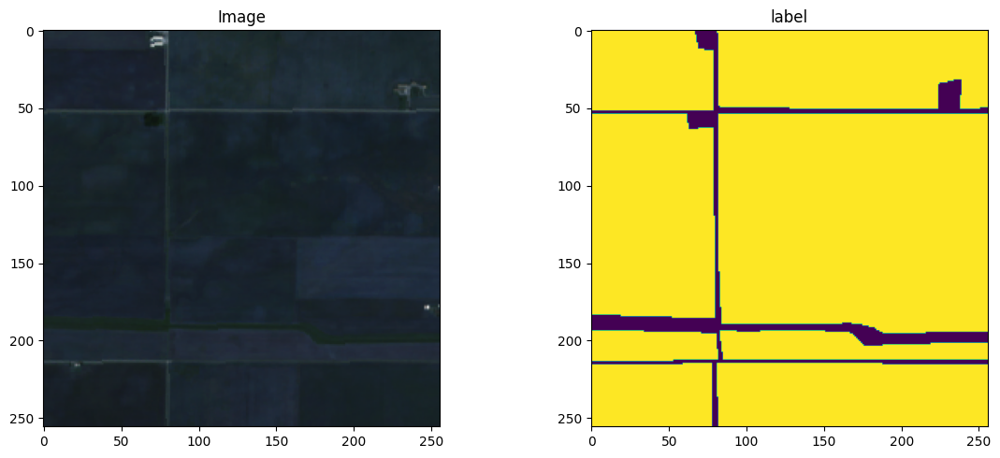

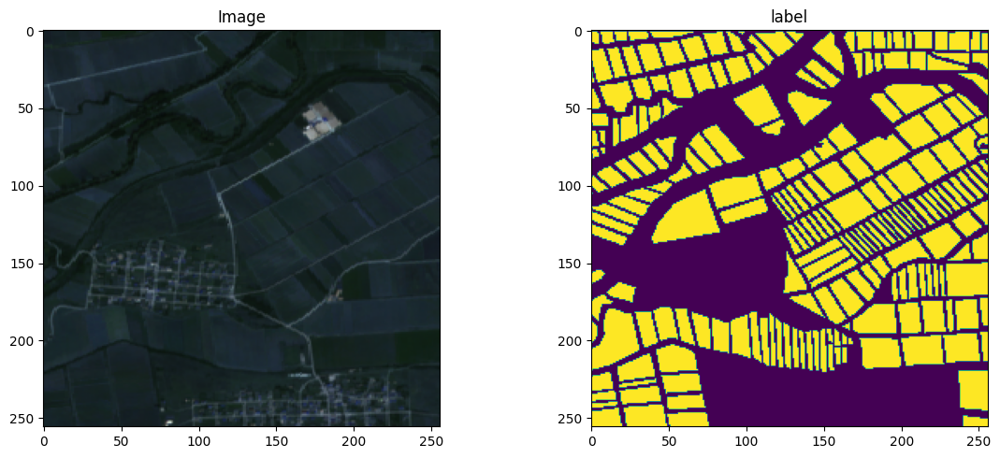

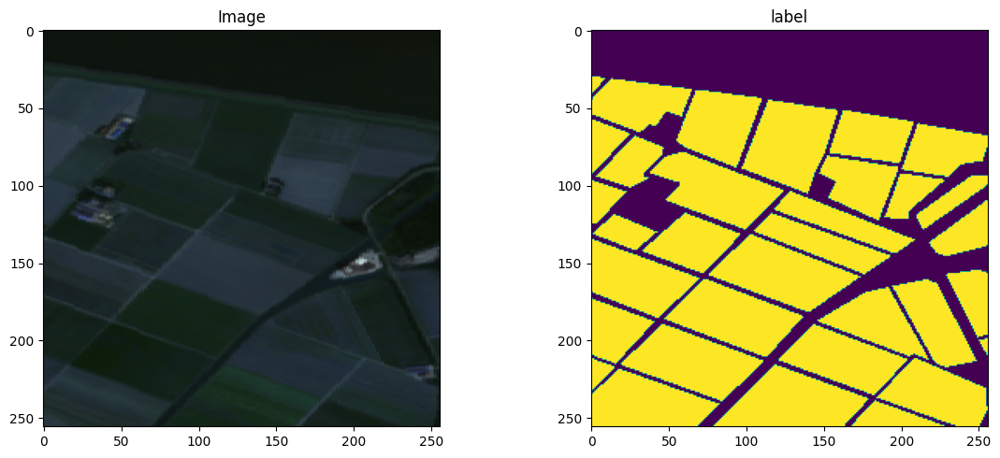

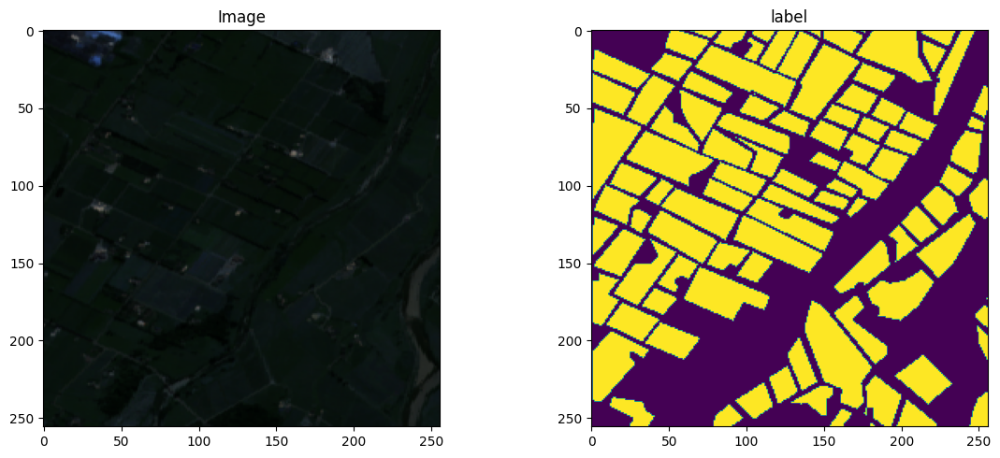

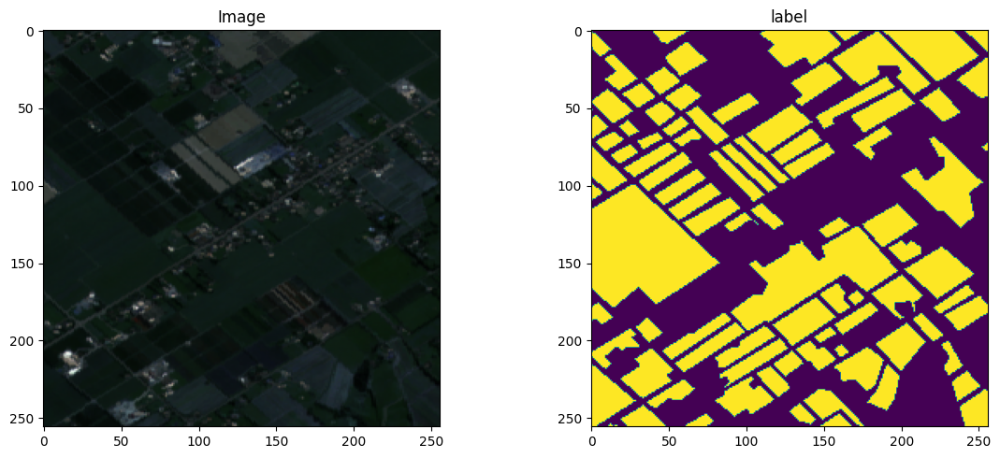

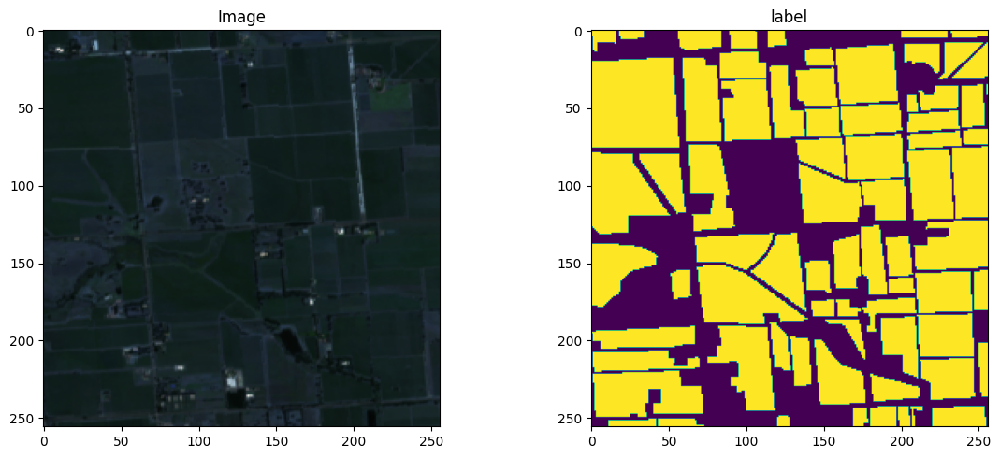

In [10]:
for i in range(10):
    trainDS.plot(i)

# training 

In [11]:
from torch.optim import SGD

In [12]:
unet = UNet()
lossFunc = BCEWithLogitsLoss()
opt = Adam(unet.parameters(), lr=0.0001)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
unet.to(device)
lossFunc.to(device)

BCEWithLogitsLoss()

In [13]:
device

device(type='cuda')

In [14]:
trainSteps = len(trainDS) // batch_size
testSteps = len(testDS) // batch_size
# initialize a dictionary to store training history
H = {"train_loss": [], "test_loss": []}


for e in tqdm(range(150)):
	# set the model in training mode
	unet.train()
	# initialize the total training and validation loss
	totalTrainLoss = 0
	totalTestLoss = 0
	for i, batch in enumerate(train_dataloader):
		# send the input to the device
		(x, y) = (batch['data'].to(device), batch['label'].to(device))
		# perform a forward pass and calculate the training loss
		pred = unet(x)
		loss = lossFunc(pred, y)
		# first, zero out any previously accumulated gradients, then
		# perform backpropagation, and then update model parameters
		opt.zero_grad()
		loss.backward()
		opt.step()
		# add the loss to the total training loss so far
		totalTrainLoss += loss
	# switch off autograd
	with torch.no_grad():
		# set the model in evaluation mode
		unet.eval()
		# loop over the validation set
		for i,batch in enumerate(validation_dataloader):
			# send the input to the device
			x, y = batch['data'].to(device), batch['label'].to(device)
			# make the predictions and calculate the validation loss
			pred = unet(x)
			totalTestLoss += lossFunc(pred, y)
	# calculate the average training and validation loss
	avgTrainLoss = totalTrainLoss / trainSteps
	avgTestLoss = totalTestLoss / testSteps
	# update our training history
	H["train_loss"].append(avgTrainLoss.cpu().detach().numpy())
	H["test_loss"].append(avgTestLoss.cpu().detach().numpy())
	# print the model training and validation information
	print("Train loss: {:.6f}, Test loss: {:.4f}".format(avgTrainLoss, avgTestLoss))


  0%|          | 0/150 [00:00<?, ?it/s]

Train loss: 0.907906, Test loss: 0.8723
Train loss: 0.861336, Test loss: 0.8502
Train loss: 0.855562, Test loss: 0.8491
Train loss: 0.843025, Test loss: 0.8402
Train loss: 0.842353, Test loss: 0.8502
Train loss: 0.832860, Test loss: 0.8325
Train loss: 0.825685, Test loss: 0.8287
Train loss: 0.823678, Test loss: 0.8249
Train loss: 0.820045, Test loss: 0.8221
Train loss: 0.816556, Test loss: 0.8258
Train loss: 0.813726, Test loss: 0.8203
Train loss: 0.812574, Test loss: 0.8242
Train loss: 0.808750, Test loss: 0.8167
Train loss: 0.806802, Test loss: 0.8163
Train loss: 0.807554, Test loss: 0.8151
Train loss: 0.806284, Test loss: 0.8138
Train loss: 0.803300, Test loss: 0.8105
Train loss: 0.802748, Test loss: 0.8197
Train loss: 0.803421, Test loss: 0.8118
Train loss: 0.798477, Test loss: 0.8126
Train loss: 0.800968, Test loss: 0.8100
Train loss: 0.803077, Test loss: 0.8123
Train loss: 0.797993, Test loss: 0.8071
Train loss: 0.794957, Test loss: 0.8102
Train loss: 0.809591, Test loss: 0.8285


In [4]:
H

model_scripted = torch.jit.script(unet) # Export to TorchScript
model_scripted.save('model_scripted.pt') # Save



NameError: name 'H' is not defined

In [5]:

model = torch.jit.load('/kaggle/working/model_scripted.pt')
model.eval()

RecursiveScriptModule(
  original_name=UNet
  (max_pool2d): RecursiveScriptModule(original_name=MaxPool2d)
  (down_convolution_1): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=BatchNorm2d)
    (2): RecursiveScriptModule(original_name=ReLU)
    (3): RecursiveScriptModule(original_name=Conv2d)
    (4): RecursiveScriptModule(original_name=BatchNorm2d)
    (5): RecursiveScriptModule(original_name=ReLU)
  )
  (down_convolution_2): RecursiveScriptModule(
    original_name=Sequential
    (0): RecursiveScriptModule(original_name=Conv2d)
    (1): RecursiveScriptModule(original_name=BatchNorm2d)
    (2): RecursiveScriptModule(original_name=ReLU)
    (3): RecursiveScriptModule(original_name=Conv2d)
    (4): RecursiveScriptModule(original_name=BatchNorm2d)
    (5): RecursiveScriptModule(original_name=ReLU)
  )
  (down_convolution_3): RecursiveScriptModule(
    original_name=Sequential
    (0): 

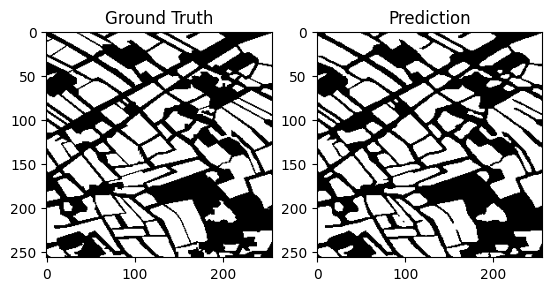

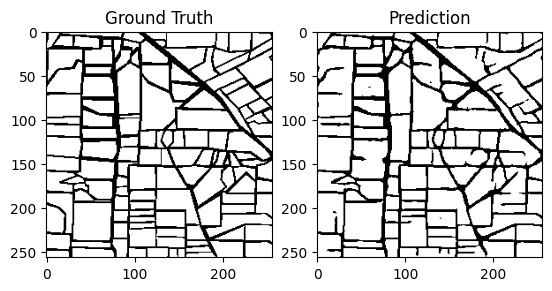

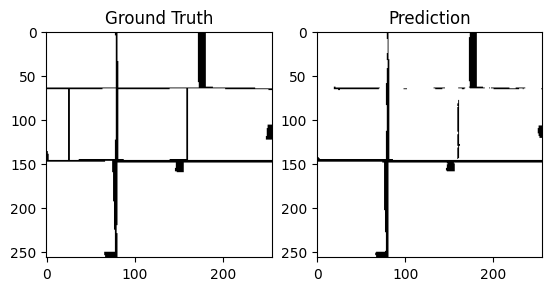

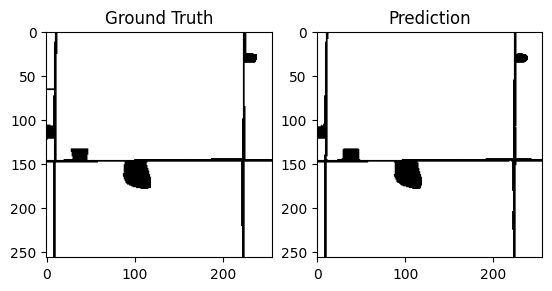

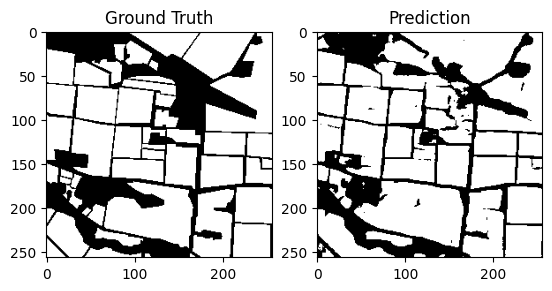

...

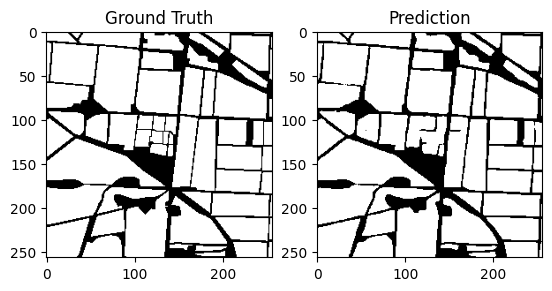

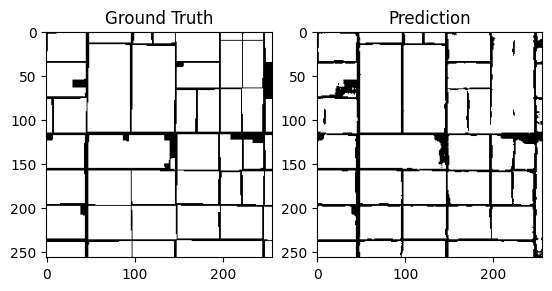

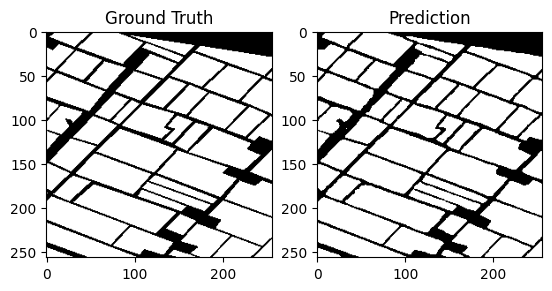

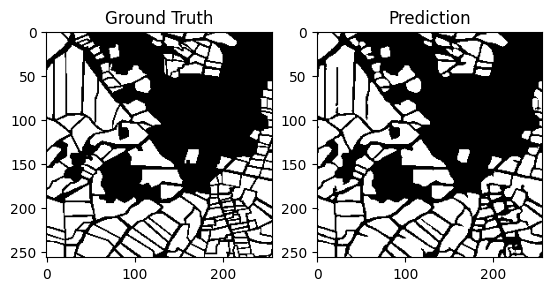

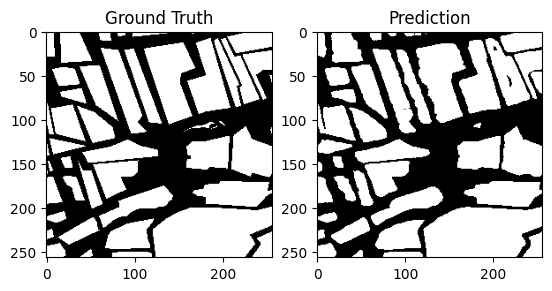

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, jaccard_score

# Load the model
model = torch.jit.load('/kaggle/working/model_scripted.pt')
model.eval()  # Set the model to evaluation mode
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize metrics
iou_list = []
dice_list = []
precision_list = []
recall_list = []
f1_list = []

# Iterate over the validation dataset
for i, batch in enumerate(validation_dataloader):
    # Send the inputs and labels to the device
    x, y = batch['data'].to(device), batch['label'].to(device)
    
    # Make the predictions
    with torch.no_grad():
        pred = model(x)  # Get model predictions
    
    # Loop over the predictions and ground truth for each image in the batch
    for y_pred, y_true in zip(pred.cpu().detach().numpy(), batch['label'].detach().numpy()):
        # The assumption is that y_true and y_pred are binary masks, so we will calculate the metrics
        y_pred = (y_pred > 0.5).astype(np.uint8)  # Thresholding to get binary output
        y_true = (y_true > 0.5).astype(np.uint8)  # Thresholding to get binary ground truth
        
        # Calculate IoU (Intersection over Union)
        iou = jaccard_score(y_true.flatten(), y_pred.flatten())
        iou_list.append(iou)
        
        # Calculate Dice Coefficient
        dice = 2 * np.sum(y_true * y_pred) / (np.sum(y_true) + np.sum(y_pred))
        dice_list.append(dice)
        
        # Calculate Precision, Recall, and F1 Score
        precision = precision_score(y_true.flatten(), y_pred.flatten())
        recall = recall_score(y_true.flatten(), y_pred.flatten())
        f1 = f1_score(y_true.flatten(), y_pred.flatten())
        
        precision_list.append(precision)
        recall_list.append(recall)
        f1_list.append(f1)
        
        # Visualize the ground truth and predicted segmentation
        plt.subplot(1, 2, 1)
        plt.imshow(y_true[0], cmap='gray')
        plt.title("Ground Truth")
        
        plt.subplot(1, 2, 2)
        plt.imshow(y_pred[0], cmap='gray')
        plt.title("Prediction")
        
        plt.show()

# Calculate the average metrics for the entire validation dataset
mean_iou = np.mean(iou_list)
mean_dice = np.mean(dice_list)
mean_precision = np.mean(precision_list)
mean_recall = np.mean(recall_list)
mean_f1 = np.mean(f1_list)

# Print the results
print(f'Mean IoU: {mean_iou:.4f}')
print(f'Mean Dice: {mean_dice:.4f}')
print(f'Mean Precision: {mean_precision:.4f}')
print(f'Mean Recall: {mean_recall:.4f}')
print(f'Mean F1 Score: {mean_f1:.4f}')


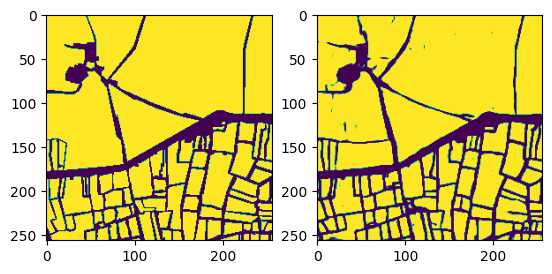

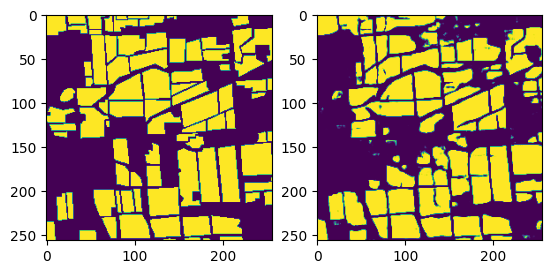

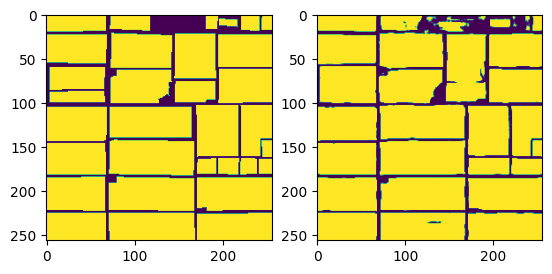

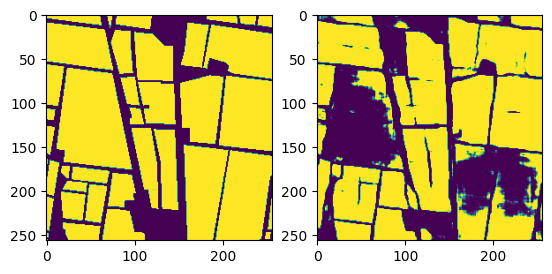

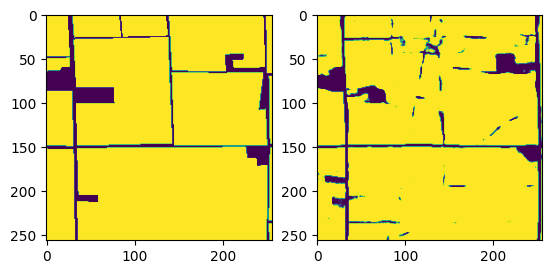

...

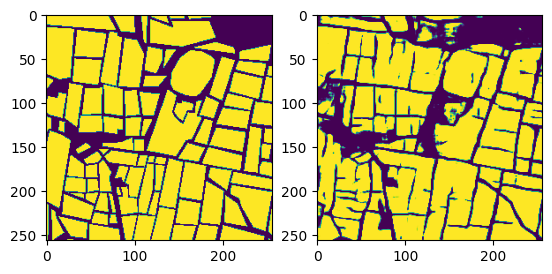

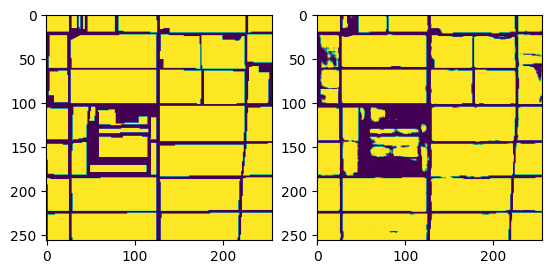

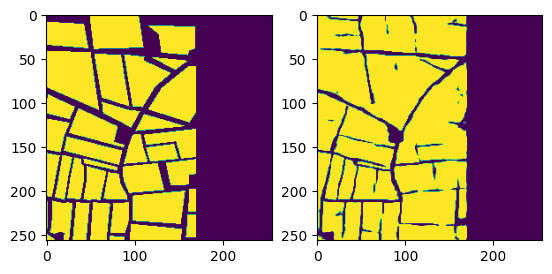

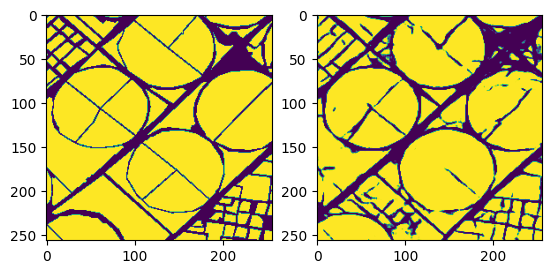

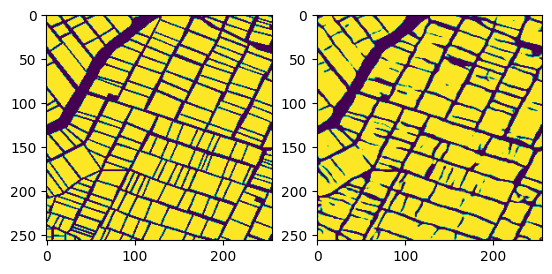

In [16]:
for i,batch in enumerate(validation_dataloader):
    # send the input to the device
    x, y = batch['data'].to(device), batch['label'].to(device)
    # make the predictions and calculate the validation loss
    pred = unet(x)
    
    for y_pred , y_true in zip(pred.cpu().detach().numpy(), batch['label'].detach().numpy()):
        plt.subplot(1,2,1)
        plt.imshow(y_true[0])
        plt.subplot(1,2,2)
        plt.imshow(y_pred[0])
        plt.show()